# Setting Up the Environment

## Installing Required Packages
This cell installs the Dask library with dataframe support. Dask allows us to process larger-than-memory datasets by providing parallel computing capabilities. It's particularly useful for our time series analysis as it enables efficient handling of the large volume of sales data across countries, stores, and products.

In [1]:
!pip install dask[dataframe]

## Configuring the Working Environment

These cells set up our Google Colab environment by:
1. Setting the working directory to a specific folder in Google Drive
2. Mounting Google Drive to access our stored files and maintain persistent storage

This configuration is essential for maintaining access to our data throughout the analysis.

In [3]:
import os
# os.chdir("/content/drive/MyDrive/Kaggle_Comp")

In [4]:
# from google.colab import drive
# drive.mount('/content/drive')

## Downloading and Preparing Competition Data

This cell sets up the Kaggle API to download competition data directly into our notebook. It:
1. Installs the Kaggle library
2. Creates a .kaggle directory for authentication
3. Copies your authentication token and sets proper permissions
4. Downloads the competition data

This automated approach is more efficient than manually downloading and uploading files.

In [ ]:
# !pip install kaggle==1.5.12
# !mkdir ~/.kaggle
# !cp kaggle.json ~/.kaggle/
# !chmod 600 ~/.kaggle/kaggle.json
!kaggle competitions download -c playground-series-s5e1

'chmod' is not recognized as an internal or external command,
operable program or batch file.


401 Client Error: Unauthorized for url: https://www.kaggle.com/api/v1/competitions/data/download-all/playground-series-s5e1


In [41]:
!kaggle datasets download -d zgrcemta/world-gdpgdp-gdp-per-capita-and-annual-growths

Dataset URL: https://www.kaggle.com/datasets/zgrcemta/world-gdpgdp-gdp-per-capita-and-annual-growths
License(s): CC0-1.0


## Extracting and Verifying the Data

These cells check our working directory and extract the downloaded competition data from the ZIP file. The zipfile module is used to extract all files into the current folder, giving us access to all the necessary data files for our analysis.

In [8]:
os.getcwd()

'C:\\Users\\ITXPC'

In [14]:
os.chdir(r"OneDrive - The Pennsylvania State University\\Amir_abb6024\\IE 561\\")

In [15]:
import zipfile

# Unzip the file
with zipfile.ZipFile('playground-series-s5e1.zip', 'r') as zip_ref:
  zip_ref.extractall('./')



In [44]:
import zipfile

# Unzip the file
with zipfile.ZipFile('world-gdpgdp-gdp-per-capita-and-annual-growths.zip', 'r') as zip_ref:
  zip_ref.extractall('./')

## Loading and Previewing the Data

In these cells, we load the competition data into pandas DataFrames. We:
1. Read the CSV files with `parse_dates=["date"]` to properly handle date columns
2. Create a backup copy of the original training data for reference
3. Display the first few rows of both training and test datasets to understand their structure

This is a critical first step that allows us to understand our time series data format and prepare for analysis.

In [16]:
import pandas as pd
train_df = pd.read_csv("train.csv", parse_dates=["date"])
original_train_df = train_df.copy()
test_df = pd.read_csv("test.csv", parse_dates=["date"])


In [17]:
display(train_df.head(3))
display(test_df.head(3))

,id,date,country,store,product,num_sold
0,0,2010-01-01,Canada,Discount Stickers,Holographic Goose,NaN
1,1,2010-01-01,Canada,Discount Stickers,Kaggle,973.0
2,2,2010-01-01,Canada,Discount Stickers,Kaggle Tiers,906.0


,id,date,country,store,product
0,230130,2017-01-01,Canada,Discount Stickers,Holographic Goose
1,230131,2017-01-01,Canada,Discount Stickers,Kaggle
2,230132,2017-01-01,Canada,Discount Stickers,Kaggle Tiers


In [73]:
train_df['product'].unique()

array(['Holographic Goose', 'Kaggle', 'Kaggle Tiers', 'Kerneler',
       'Kerneler Dark Mode'], dtype=object)

In [74]:
train_df['country'].unique()

array(['Canada', 'Finland', 'Italy', 'Kenya', 'Norway', 'Singapore'],
      dtype=object)

In [76]:
train_df['store'].unique()

array(['Discount Stickers', 'Stickers for Less', 'Premium Sticker Mart'],
      dtype=object)

# Exploratory Data Analysis

## Setting Up Data Analysis Libraries

This cell imports essential libraries for data analysis and visualization:
- NumPy: Provides numerical computing functions
- Pandas: Handles data structures and operations
- Matplotlib and Seaborn: Create visualizations
- Ridge regression from scikit-learn: For potential modeling

We also set a dark grid style for all plots to improve readability.

In [18]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.linear_model import Ridge
sns.set_style('darkgrid')


## Custom Utility Functions for Categorical Analysis

This cell defines three important utility functions that we'll use throughout our analysis:

1. `get_val_counts()`: Calculates the count and percentage of each unique value in a specified column
2. `plot_value_counts_pie()`: Creates pie charts to visualize category distributions
3. `plot_value_counts_bar()`: Creates bar charts with both count and percentage labels

These functions make our exploratory analysis more efficient and consistent, allowing us to quickly visualize the distribution of any categorical variable in our dataset.

In [19]:
import seaborn as sns
import matplotlib.pyplot as plt

def get_val_counts(df, column_name, sort_by_column_name=False):
    """
    Get value counts for a specified column in a dataframe with percentages.

    Args:
        df (DataFrame): The input dataframe.
        column_name (str): Column to analyze.
        sort_by_column_name (bool): If True, sorts by column name.

    Returns:
        DataFrame: Value counts and percentages.
    """

    value_count = (
        df[column_name]
        .value_counts()
        .reset_index()
        .rename(columns={"count": "Value Count"})
        .set_index(column_name)
    )
    value_count["Percentage"] = df[column_name].value_counts(normalize=True) * 100
    value_count = value_count.reset_index()
    if sort_by_column_name:
        value_count = value_count.sort_values(column_name)
    return value_count

def plot_value_counts_pie(df, column_name, sort_by_column_name=False):
    """
    Plot a pie chart for value counts of a specified column.

    Args:
        df (DataFrame): The input dataframe.
        column_name (str): Column to analyze.
        sort_by_column_name (bool): If True, sorts by column name.
    """
    val_count_df = get_val_counts(df, column_name, sort_by_column_name)
    val_count_df.set_index(column_name).plot.pie(
        y="Value Count", figsize=(6, 6), legend=False, ylabel=""
    )
    plt.title(f"Pie Chart of {column_name}")
    plt.show()

def plot_value_counts_bar(df, column_name, sort_by_column_name=False):
    """
    Plot a bar chart for value counts of a specified column.

    Args:
        df (DataFrame): The input dataframe.
        column_name (str): Column to analyze.
        sort_by_column_name (bool): If True, sorts by column name.
    """
    val_count_df = get_val_counts(df, column_name, sort_by_column_name)
    print(val_count_df)
    plt.figure(figsize=(12, 6))
    ax = sns.barplot(data=val_count_df, x=column_name, y="Value Count")

    for index, row in val_count_df.iterrows():
        count = row["Value Count"]
        percentage = row["Percentage"]
        ax.text(
            x=index,
            y=row["Value Count"] + max(val_count_df["Value Count"]) * 0.02,
            s=f"{count} ({percentage:.2f}%)",
            ha="center",
            va="bottom",
        )

    plt.title(f"Bar Chart of {column_name}")
    plt.xticks(rotation=45, ha="right")
    plt.tight_layout()
    plt.show()


## Analyzing Categorical Variables

These cells visualize the distribution of our three main categorical variables (country, store, and product) using bar charts. The visualizations show:
- The count of observations for each category
- The percentage each category represents of the total dataset

This helps us understand the composition of our dataset and identify any imbalances or dominant categories that might influence our forecasting approach.

     country  Value Count  Percentage
0     Canada        38355   16.666667
1    Finland        38355   16.666667
2      Italy        38355   16.666667
3      Kenya        38355   16.666667
4     Norway        38355   16.666667
5  Singapore        38355   16.666667


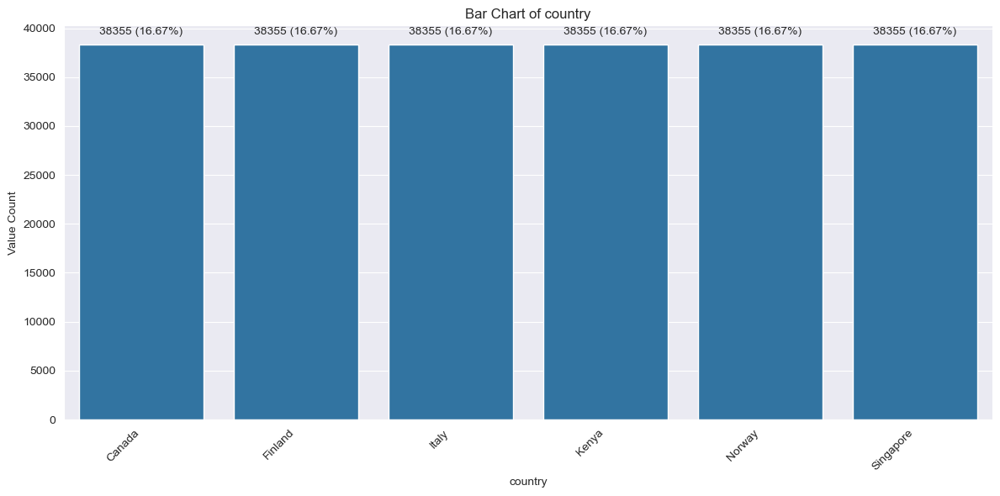

In [20]:
plot_value_counts_bar(train_df, "country")

                  store  Value Count  Percentage
0     Discount Stickers        76710   33.333333
1     Stickers for Less        76710   33.333333
2  Premium Sticker Mart        76710   33.333333


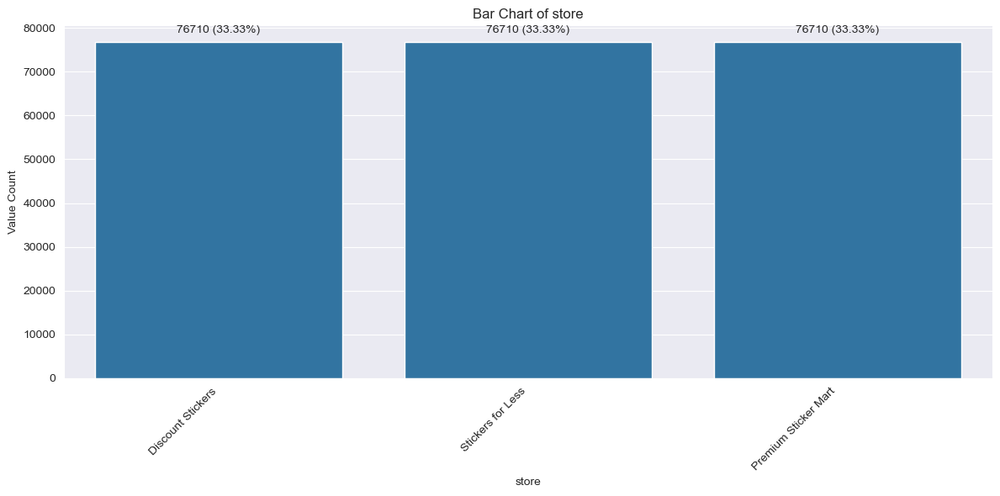

In [21]:
plot_value_counts_bar(train_df, "store")

In [ ]:
plot_value_counts_bar(train_df, "product")

# Introduction to pandas.groupby

* The groupby method is used to split a DataFrame into groups based on values in one or more columns.

* It enables powerful data aggregation and transformation operations.

* Typical steps: Split → Apply → Combine

# Basic Syntax

df.groupby('column_name')
Example:

df.groupby('department')
Note:

This doesn't compute anything yet. Just creates a group object.





In [2]:
import pandas as pd

df = pd.DataFrame({
    'Department': ['Sales', 'Sales', 'HR', 'HR'],
    'Salary': [50000, 60000, 45000, 47000]
})

grouped = df.groupby('Department')


In [5]:
df

,Department,Salary
0,Sales,50000
1,Sales,60000
2,HR,45000
3,HR,47000


In [6]:
print(grouped)

In [7]:
grouped.groups

{'HR': [2, 3], 'Sales': [0, 1]}

# Aggregation with groupby

Code:

df.groupby('department')['salary'].mean()

Explanation:

Groups data by "department"

Then calculates the mean salary for each department

Code:

df.groupby('department')[['salary', 'bonus']].agg(['mean', 'sum'])

Explanation:

Calculate both mean and sum for multiple columns

Output is a multi-level column DataFrame




In [8]:
df.groupby('Department')['Salary'].mean()

Department
HR       46000.0
Sales    55000.0
Name: Salary, dtype: float64

In [9]:
df.groupby('Department')['Salary'].agg('mean')

Department
HR       46000.0
Sales    55000.0
Name: Salary, dtype: float64

same output because we asked pandas to apply the same function

In [10]:
df.groupby('Department')['Salary'].agg(['mean','sum'])

,mean,sum
Department,,
HR,46000.0,92000
Sales,55000.0,110000


In [12]:
# Calculate both mean and sum for multiple columns.
df['Bonus'] = [5000, 7000, 4000, 3000]
df.groupby('Department')[['Salary', 'Bonus']].agg(['mean', 'sum'])


Salary           Bonus       
               mean     sum    mean    sum
Department                                
HR          46000.0   92000  3500.0   7000
Sales       55000.0  110000  6000.0  12000

# Grouping by Multiple Columns

Code: 

df.groupby(['department', 'gender'])['salary'].mean()
Explanation:

Groups first by department, then by gender

Useful for detailed subgroup analysis


In [13]:
df['Gender'] = ['M', 'F', 'F', 'M']
df.groupby(['Department', 'Gender'])['Salary'].mean()


Department  Gender
HR          F         45000.0
            M         47000.0
Sales       F         60000.0
            M         50000.0
Name: Salary, dtype: float64

,Department,Salary
0,HR,46000.0
1,Sales,55000.0


# Custom Functions
Code:

df.groupby('department')['salary'].apply(lambda x: x.max() - x.min())

Explanation:

Apply a custom function to each group

In this case, it calculates salary range



# Transform vs. Aggregate

**agg: returns one row per group**

df.groupby('department')['salary'].agg('mean'n')


In [17]:
df

,Department,Salary,Bonus,Gender,Mean_Salary
0,Sales,50000,5000,M,55000.0
1,Sales,60000,7000,F,55000.0
2,HR,45000,4000,F,46000.0
3,HR,47000,3000,M,46000.0


In [16]:
df.groupby('Department')['Salary'].agg('mean')

Department
HR       46000.0
Sales    55000.0
Name: Salary, dtype: float64

In [18]:
# Add group mean salary as a new column
df['Mean_Salary'] = df.groupby('Department')['Salary'].transform('mean')
(df)


,Department,Salary,Bonus,Gender,Mean_Salary
0,Sales,50000,5000,M,55000.0
1,Sales,60000,7000,F,55000.0
2,HR,45000,4000,F,46000.0
3,HR,47000,3000,M,46000.0


**transform: returns one row per original row**

df['mean_salary'] = df.groupby('department')['salary'].transform('mean')

**agg()** reduces the data


**transform()** keeps original shape (useful for feature engineering)


## Checking Time Series Structure

This cell examines how many time series points we have for each combination of country, store, and product. We group the data and count the rows for each unique combination, then summarize how many combinations have a particular number of data points.

This helps us identify if we have complete or incomplete time series before beginning our modeling work.

In [23]:
counts = train_df.groupby(["country","store","product"])["id"].count().rename("num_rows").reset_index()
counts_val_counts = counts["num_rows"].value_counts().rename("Count").reset_index().rename(columns={"index": "length"})
display(counts_val_counts.head(10))

,num_rows,Count
0,2557,90


In [25]:
counts

,country,store,product,num_rows
0,Canada,Discount Stickers,Holographic Goose,2557
1,Canada,Discount Stickers,Kaggle,2557
2,Canada,Discount Stickers,Kaggle Tiers,2557
3,Canada,Discount Stickers,Kerneler,2557
4,Canada,Discount Stickers,Kerneler Dark Mode,2557
...,...,...,...,...
85,Singapore,Stickers for Less,Holographic Goose,2557
86,Singapore,Stickers for Less,Kaggle,2557
87,Singapore,Stickers for Less,Kaggle Tiers,2557
88,Singapore,Stickers for Less,Kerneler,2557


In total we have 90 univariate time series all of length 2557

## Analyzing Missing Data

These cells identify and quantify missing values in our dataset. We:
1. Count the total number of missing values in the target variable
2. Group the data by country, store, and product to identify which specific time series have fewer than the expected 2,557 data points
3. Calculate how many data points are missing from each series

This analysis is crucial for understanding data completeness before modeling and helps determine our imputation strategy.

In [24]:
print(f"Number of missing num_sold rows: {train_df['num_sold'].isna().sum()}")

Number of missing num_sold rows: 8871


In [26]:
counts = train_df.groupby(["country","store","product"])["num_sold"].count().rename("num_rows")
missing_data = counts.loc[counts != 2557]
missing_data_df = missing_data.reset_index()
missing_data_df["num_missing_rows"] = 2557 - missing_data_df["num_rows"]
missing_data_df

,country,store,product,num_rows,num_missing_rows
0,Canada,Discount Stickers,Holographic Goose,0,2557
1,Canada,Discount Stickers,Kerneler,2556,1
2,Canada,Premium Sticker Mart,Holographic Goose,2177,380
3,Canada,Stickers for Less,Holographic Goose,1249,1308
4,Kenya,Discount Stickers,Holographic Goose,0,2557
5,Kenya,Discount Stickers,Kerneler,2494,63
6,Kenya,Discount Stickers,Kerneler Dark Mode,2556,1
7,Kenya,Premium Sticker Mart,Holographic Goose,1911,646
8,Kenya,Stickers for Less,Holographic Goose,1199,1358


In [27]:
missing_data.index

MultiIndex([('Canada',    'Discount Stickers',  'Holographic Goose'),
            ('Canada',    'Discount Stickers',           'Kerneler'),
            ('Canada', 'Premium Sticker Mart',  'Holographic Goose'),
            ('Canada',    'Stickers for Less',  'Holographic Goose'),
            ( 'Kenya',    'Discount Stickers',  'Holographic Goose'),
            ( 'Kenya',    'Discount Stickers',           'Kerneler'),
            ( 'Kenya',    'Discount Stickers', 'Kerneler Dark Mode'),
            ( 'Kenya', 'Premium Sticker Mart',  'Holographic Goose'),
            ( 'Kenya',    'Stickers for Less',  'Holographic Goose')],
           names=['country', 'store', 'product'])

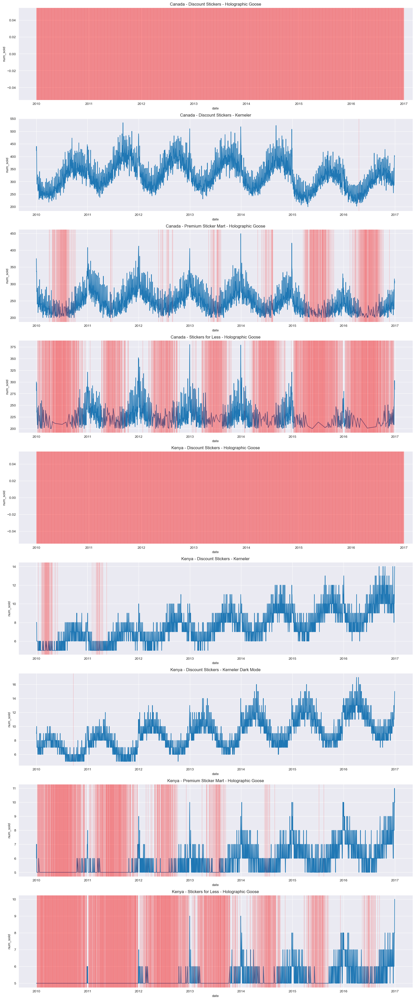

In [28]:
f,axs = plt.subplots(9,1, figsize=(20,50))
for i, (country, store, product) in enumerate(missing_data.index):
    plot_df = train_df.loc[(train_df["country"] == country) & (train_df["store"] == store) & (train_df["product"] == product)]
    missing_vals = plot_df.loc[plot_df["num_sold"].isna()]
    sns.lineplot(data=plot_df, x="date", y="num_sold", ax=axs[i])
    for missing_date in missing_vals["date"]:
        axs[i].axvline(missing_date, color='red',  linestyle='-', linewidth=1, alpha=0.2)
    axs[i].set_title(f"{country} - {store} - {product}")

In [29]:
print("Train - Earliest date:", train_df["date"].min())
print("Train - Latest date:", train_df["date"].max())

print("Test - Earliest date:", test_df["date"].min())
print("Test - Latest date:", test_df["date"].max())

Train - Earliest date: 2010-01-01 00:00:00
Train - Latest date: 2016-12-31 00:00:00
Test - Earliest date: 2017-01-01 00:00:00
Test - Latest date: 2019-12-31 00:00:00


*   We have 7 years of data from 2010-01-01 to 2016-12-31 to train occuring at daily frequency.
*   We are required to forecast 3 year of data, from 2017-01-01 to 2019-12-31





## Examining Date Ranges

These cells print the date ranges for both training and test datasets. Understanding the timeframes is essential for time series forecasting as it shows:

1. The historical period we have data for (7 years of training data from 2010-2016)
2. The future period we need to predict (3 years from 2017-2019)

This information directly influences our modeling strategy and feature engineering approach.

In [30]:
print("Train - Earliest date:", train_df["date"].min())
print("Train - Latest date:", train_df["date"].max())

print("Test - Earliest date:", test_df["date"].min())
print("Test - Latest date:", test_df["date"].max())

Train - Earliest date: 2010-01-01 00:00:00
Train - Latest date: 2016-12-31 00:00:00
Test - Earliest date: 2017-01-01 00:00:00
Test - Latest date: 2019-12-31 00:00:00


*   We have 7 years of data from 2010-01-01 to 2016-12-31 to train occuring at daily frequency.
*   We are required to forecast 3 year of data, from 2017-01-01 to 2019-12-31





## Creating Time Series Aggregations

These cells aggregate the time series data at different levels (weekly and monthly) to help identify patterns that might be obscured in the daily data. We use pandas' `Grouper` function with different frequency parameters to:

1. Create weekly aggregations with `freq="W"`
2. Create monthly aggregations with `freq="MS"` (month start)

This aggregation helps us better visualize both mid-term and long-term trends in the data.

In [31]:
weekly_df = train_df.groupby(["country","store", "product", pd.Grouper(key="date", freq="W")])["num_sold"].sum().rename("num_sold").reset_index()
monthly_df = train_df.groupby(["country","store", "product", pd.Grouper(key="date", freq="MS")])["num_sold"].sum().rename("num_sold").reset_index()

In [32]:
def plot_all(df):
    f,axes = plt.subplots(3,2,figsize=(25,25), sharex = True, sharey=True)
    f.tight_layout()
    for n,prod in enumerate(df["product"].unique()):
        plot_df = df.loc[df["product"] == prod]
        sns.lineplot(data=plot_df, x="date", y="num_sold", hue="country", style="store",ax=axes[n//2,n%2])
        axes[n//2,n%2].set_title("Product: "+str(prod))


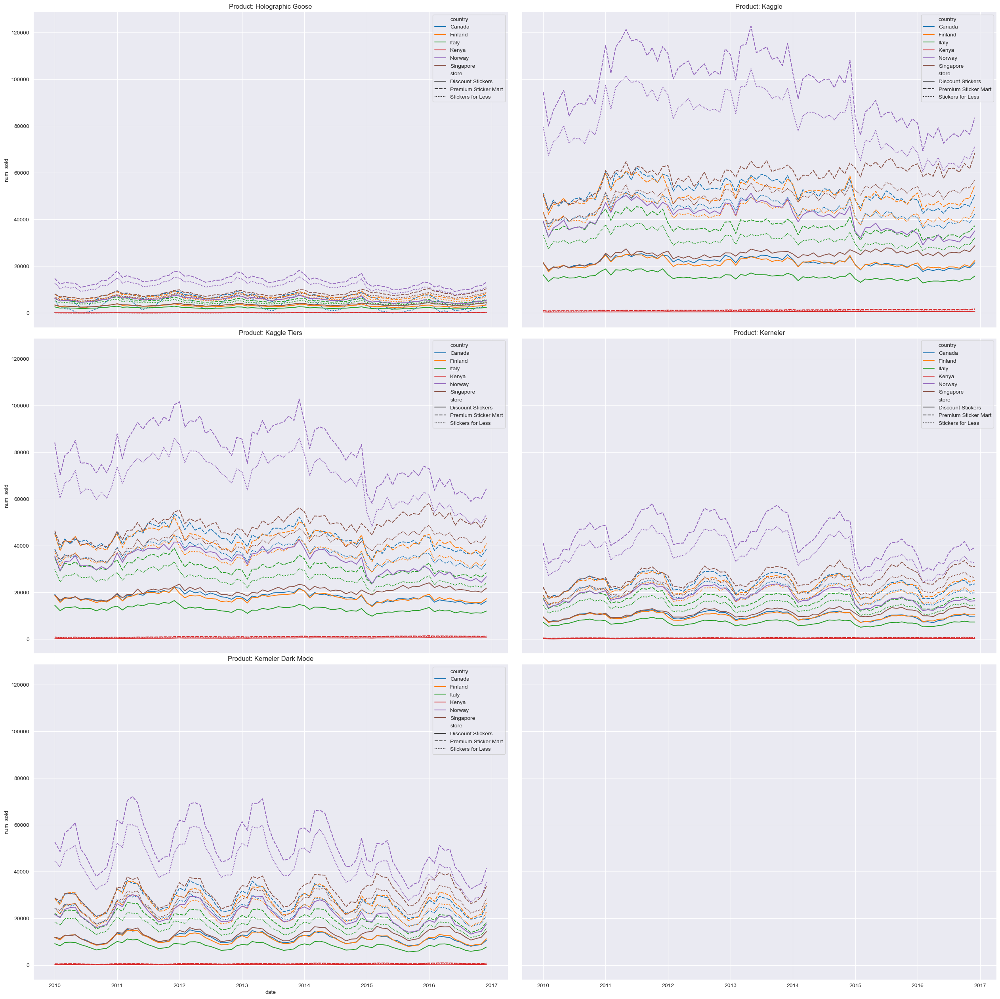

In [33]:
plot_all(monthly_df)

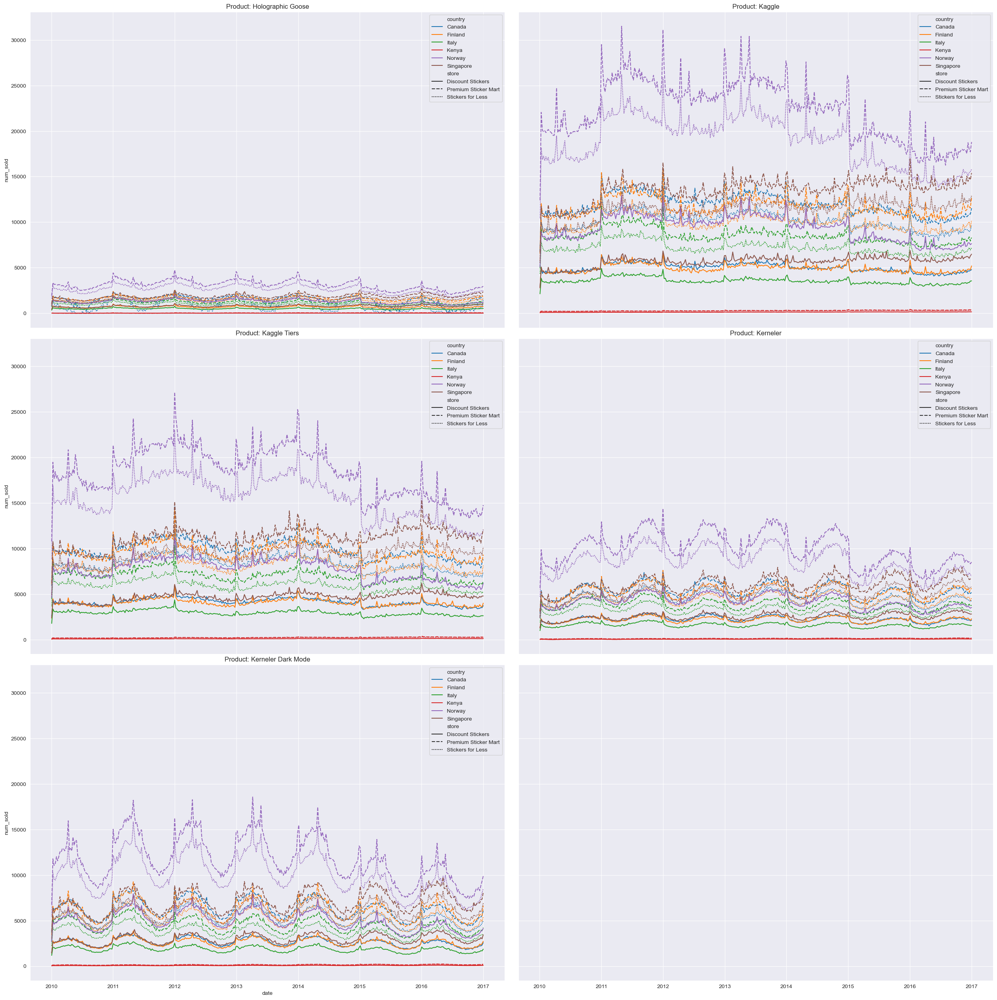

In [34]:
plot_all(weekly_df)

# Aggregating Time Series

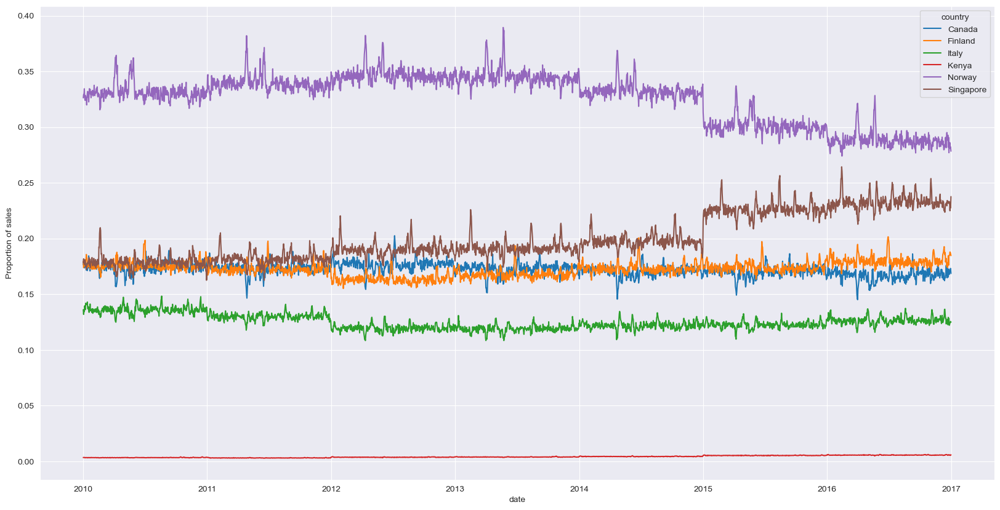

In [35]:
country_weights = train_df.groupby("country")["num_sold"].sum()/train_df["num_sold"].sum()

country_ratio_over_time = (train_df.groupby(["date","country"])["num_sold"].sum() / train_df.groupby(["date"])["num_sold"].sum()).reset_index()
f,ax = plt.subplots(figsize=(20,10))
sns.lineplot(data = country_ratio_over_time, x="date", y="num_sold", hue="country");
ax.set_ylabel("Proportion of sales");

In [36]:
gdp_per_capita_filtered_ratios_df

NameError: name 'gdp_per_capita_filtered_ratios_df' is not defined

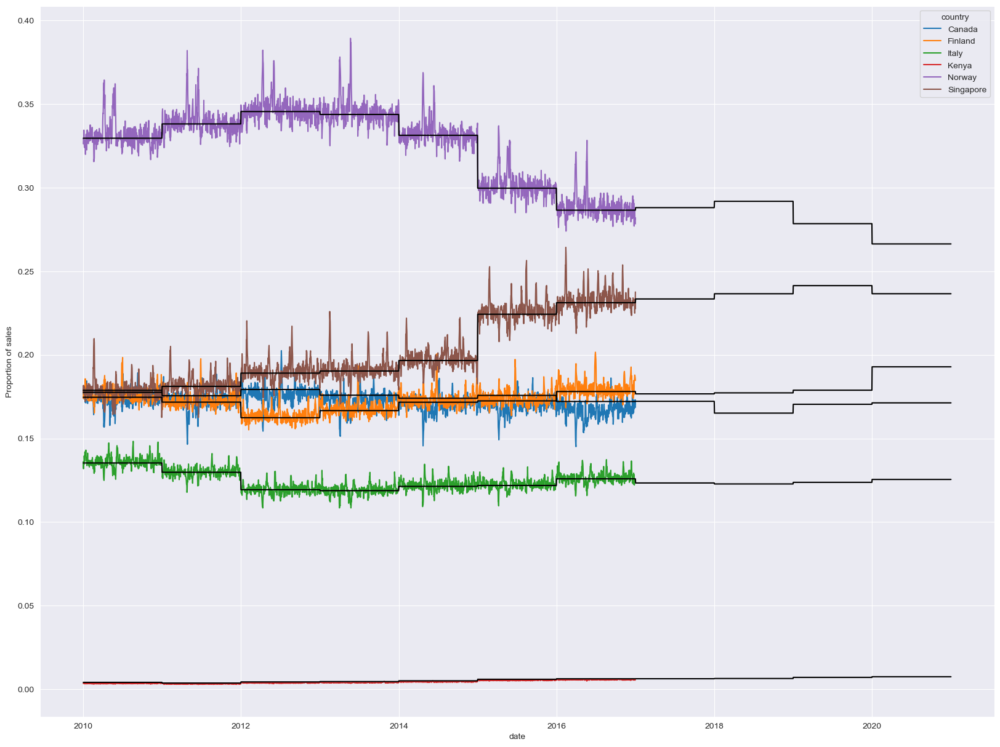

In [45]:
gdp_per_capita_df = pd.read_csv("gdp_per_capita.csv")

years =  ["2010", "2011", "2012", "2013", "2014", "2015", "2016", "2017", "2018", "2019", "2020"]
gdp_per_capita_filtered_df = gdp_per_capita_df.loc[gdp_per_capita_df["Country Name"].isin(train_df["country"].unique()), ["Country Name"] + years].set_index("Country Name")
gdp_per_capita_filtered_df["2010_ratio"] = gdp_per_capita_filtered_df["2010"] / gdp_per_capita_filtered_df.sum()["2010"]
for year in years:
    gdp_per_capita_filtered_df[f"{year}_ratio"] = gdp_per_capita_filtered_df[year] / gdp_per_capita_filtered_df.sum()[year]
gdp_per_capita_filtered_ratios_df = gdp_per_capita_filtered_df[[i+"_ratio" for i in years]]
gdp_per_capita_filtered_ratios_df.columns = [int(i) for i in years]
gdp_per_capita_filtered_ratios_df = gdp_per_capita_filtered_ratios_df.unstack().reset_index().rename(columns = {"level_0": "year", 0: "ratio", "Country Name": "country"})
gdp_per_capita_filtered_ratios_df['year'] = pd.to_datetime(gdp_per_capita_filtered_ratios_df['year'], format='%Y')

# For plotting purposes
gdp_per_capita_filtered_ratios_df_2 = gdp_per_capita_filtered_ratios_df.copy()
gdp_per_capita_filtered_ratios_df_2["year"] = pd.to_datetime(gdp_per_capita_filtered_ratios_df_2['year'].astype(str)) + pd.offsets.YearEnd(1)
gdp_per_capita_filtered_ratios_df = pd.concat([gdp_per_capita_filtered_ratios_df, gdp_per_capita_filtered_ratios_df_2]).reset_index()

f,ax = plt.subplots(figsize=(20,15))
sns.lineplot(data = country_ratio_over_time, x="date", y="num_sold", hue="country");
sns.lineplot(data = gdp_per_capita_filtered_ratios_df, x="year", y = "ratio", hue="country", palette = ["black"]*6, legend = False)
ax.set_ylabel("Proportion of sales");

Observations:

The black line shows the ratio of GDP per captia for each year for that country compared to the sum of GDP per capita for all the other countries.
Note that Canada and Kenya do not perfectly allign to these ratios, likely because of missing values, this is fine.
There might be some slight non-random noise here, so perhaps this method isn't quite perfect?

Insight:

This means we can predict the proportion of sales between each country for each year that we have to forecast for, by considering the annual GDP per capita. This means we can aggregate the number of sales across countries for each product and store when making the forecast and then disagregate using the known annual GDP per capita ratios for the years we are predicting for. To prove this we can see if the lines for countries overlap with each other when applying our ratios of GDP per captia for each country and year.


In [46]:
gdp_per_capita_filtered_ratios_df_2["year"] = gdp_per_capita_filtered_ratios_df_2["year"].dt.year

In [47]:
def plot_adjust_country(df):
    new_df = df.copy()
    new_df["year"] = new_df["date"].dt.year

    for country in new_df["country"].unique():
        for year in new_df["year"].unique():
            new_df.loc[(new_df["country"] == country) & (new_df["year"] == year), "num_sold"] = new_df.loc[(new_df["country"] == country) & (new_df["year"] == year), "num_sold"] / gdp_per_capita_filtered_ratios_df_2.loc[(gdp_per_capita_filtered_ratios_df_2["country"] == country) & (gdp_per_capita_filtered_ratios_df_2["year"] == year), "ratio"].values[0]

    plot_all(new_df)

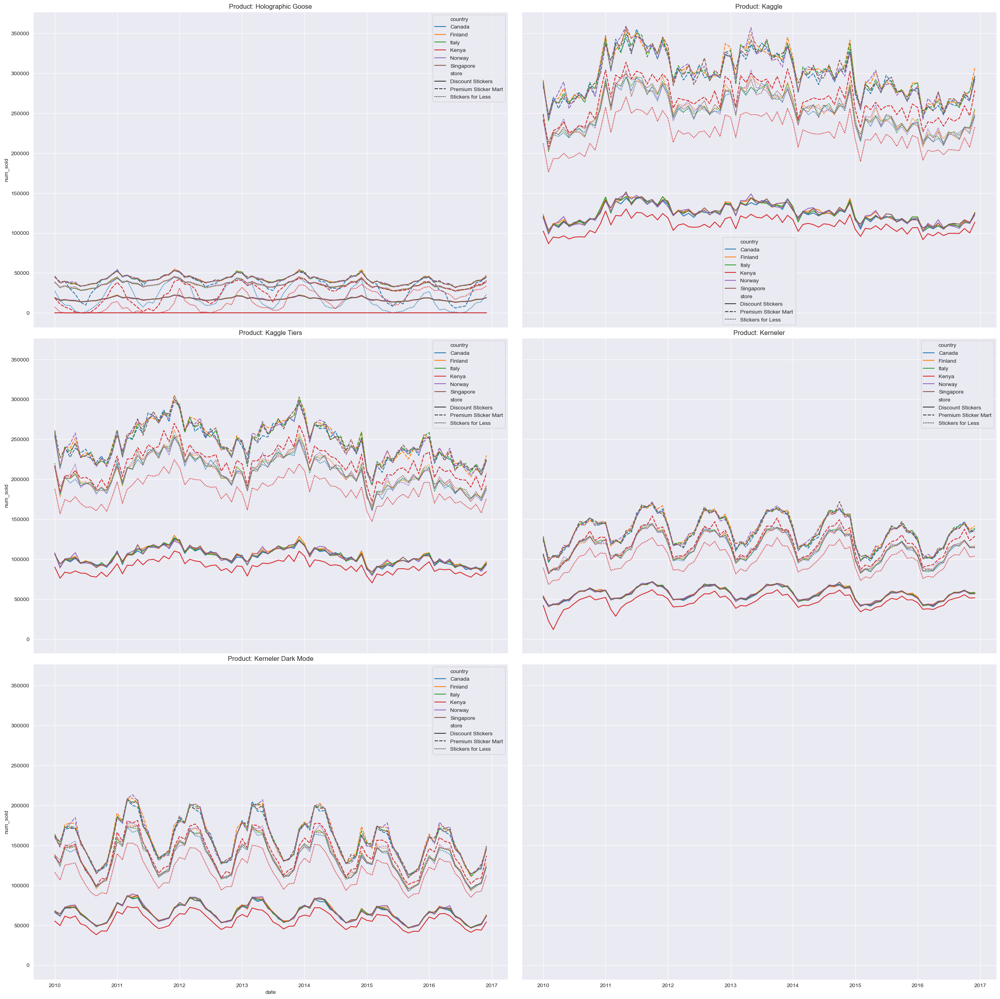

In [48]:
plot_adjust_country(monthly_df)

Observations:

With the exception of Kenya (probably as the number of sales from Kenya are very low e.g. 5 sales a day and times by a very large constant) and sometimes Canada (because of the missing values) the number of sales overlap well for each store and product!

Insights:

We can aggregate Countries when making the forecast and then disagregate the forecast by using the known ratios of GDP per capita for each year for each country.
We can use this information for imputation of the missing values (including the completely missing time series) by looking at sales from the same product and some store but for differnt countries, and applying the ratios to guess what the missing values would have been.


In [49]:
train_df_imputed = train_df.copy()
print(f"Missing values remaining: {train_df_imputed['num_sold'].isna().sum()}")

train_df_imputed["year"] = train_df_imputed["date"].dt.year
for year in train_df_imputed["year"].unique():
    # Impute Time Series 1 (Canada, Discount Stickers, Holographic Goose)
    target_ratio = gdp_per_capita_filtered_ratios_df_2.loc[(gdp_per_capita_filtered_ratios_df_2["year"] == year) & (gdp_per_capita_filtered_ratios_df_2["country"] == "Norway"), "ratio"].values[0] # Using Norway as should have the best precision
    current_raito = gdp_per_capita_filtered_ratios_df_2.loc[(gdp_per_capita_filtered_ratios_df_2["year"] == year) & (gdp_per_capita_filtered_ratios_df_2["country"] == "Canada"), "ratio"].values[0]
    ratio_can = current_raito / target_ratio
    train_df_imputed.loc[(train_df_imputed["country"] == "Canada") & (train_df_imputed["store"] == "Discount Stickers") & (train_df_imputed["product"] == "Holographic Goose") & (train_df_imputed["year"] == year), "num_sold"] = (train_df_imputed.loc[(train_df_imputed["country"] == "Norway") & (train_df_imputed["store"] == "Discount Stickers") & (train_df_imputed["product"] == "Holographic Goose") & (train_df_imputed["year"] == year), "num_sold"] * ratio_can).values

    # Impute Time Series 2 (Only Missing Values)
    current_ts =  train_df_imputed.loc[(train_df_imputed["country"] == "Canada") & (train_df_imputed["store"] == "Premium Sticker Mart") & (train_df_imputed["product"] == "Holographic Goose") & (train_df_imputed["year"] == year)]
    missing_ts_dates = current_ts.loc[current_ts["num_sold"].isna(), "date"]
    train_df_imputed.loc[(train_df_imputed["country"] == "Canada") & (train_df_imputed["store"] == "Premium Sticker Mart") & (train_df_imputed["product"] == "Holographic Goose") & (train_df_imputed["year"] == year) & (train_df_imputed["date"].isin(missing_ts_dates)), "num_sold"] = (train_df_imputed.loc[(train_df_imputed["country"] == "Norway") & (train_df_imputed["store"] == "Premium Sticker Mart") & (train_df_imputed["product"] == "Holographic Goose") & (train_df_imputed["year"] == year) & (train_df_imputed["date"].isin(missing_ts_dates)), "num_sold"] * ratio_can).values

    # Impute Time Series 3 (Only Missing Values)
    current_ts =  train_df_imputed.loc[(train_df_imputed["country"] == "Canada") & (train_df_imputed["store"] == "Stickers for Less") & (train_df_imputed["product"] == "Holographic Goose") & (train_df_imputed["year"] == year)]
    missing_ts_dates = current_ts.loc[current_ts["num_sold"].isna(), "date"]
    train_df_imputed.loc[(train_df_imputed["country"] == "Canada") & (train_df_imputed["store"] == "Stickers for Less") & (train_df_imputed["product"] == "Holographic Goose") & (train_df_imputed["year"] == year) & (train_df_imputed["date"].isin(missing_ts_dates)), "num_sold"] = (train_df_imputed.loc[(train_df_imputed["country"] == "Norway") & (train_df_imputed["store"] == "Stickers for Less") & (train_df_imputed["product"] == "Holographic Goose") & (train_df_imputed["year"] == year) & (train_df_imputed["date"].isin(missing_ts_dates)), "num_sold"] * ratio_can).values

    # Impute Time Series 4 (Kenya, Discount Stickers, Holographic Goose)
    current_raito = gdp_per_capita_filtered_ratios_df_2.loc[(gdp_per_capita_filtered_ratios_df_2["year"] == year) & (gdp_per_capita_filtered_ratios_df_2["country"] == "Kenya"), "ratio"].values[0]
    ratio_ken = current_raito / target_ratio
    train_df_imputed.loc[(train_df_imputed["country"] == "Kenya") & (train_df_imputed["store"] == "Discount Stickers") & (train_df_imputed["product"] == "Holographic Goose") & (train_df_imputed["year"] == year), "num_sold"] = (train_df_imputed.loc[(train_df_imputed["country"] == "Norway") & (train_df_imputed["store"] == "Discount Stickers") & (train_df_imputed["product"] == "Holographic Goose")& (train_df_imputed["year"] == year), "num_sold"] * ratio_ken).values

    # Impute Time Series 5 (Only Missing Values)
    current_ts = train_df_imputed.loc[(train_df_imputed["country"] == "Kenya") & (train_df_imputed["store"] == "Premium Sticker Mart") & (train_df_imputed["product"] == "Holographic Goose") & (train_df_imputed["year"] == year)]
    missing_ts_dates = current_ts.loc[current_ts["num_sold"].isna(), "date"]
    train_df_imputed.loc[(train_df_imputed["country"] == "Kenya") & (train_df_imputed["store"] == "Premium Sticker Mart") & (train_df_imputed["product"] == "Holographic Goose") & (train_df_imputed["year"] == year) & (train_df_imputed["date"].isin(missing_ts_dates)), "num_sold"] = (train_df_imputed.loc[(train_df_imputed["country"] == "Norway") & (train_df_imputed["store"] == "Premium Sticker Mart") & (train_df_imputed["product"] == "Holographic Goose") & (train_df_imputed["year"] == year) & (train_df_imputed["date"].isin(missing_ts_dates)), "num_sold"] * ratio_ken).values

    # Impute Time Series 6 (Only Missing Values)
    current_ts = train_df_imputed.loc[(train_df_imputed["country"] == "Kenya") & (train_df_imputed["store"] == "Stickers for Less") & (train_df_imputed["product"] == "Holographic Goose") & (train_df_imputed["year"] == year)]
    missing_ts_dates = current_ts.loc[current_ts["num_sold"].isna(), "date"]
    train_df_imputed.loc[(train_df_imputed["country"] == "Kenya") & (train_df_imputed["store"] == "Stickers for Less") & (train_df_imputed["product"] == "Holographic Goose") & (train_df_imputed["year"] == year) & (train_df_imputed["date"].isin(missing_ts_dates)), "num_sold"] = (train_df_imputed.loc[(train_df_imputed["country"] == "Norway") & (train_df_imputed["store"] == "Stickers for Less") & (train_df_imputed["product"] == "Holographic Goose") & (train_df_imputed["year"] == year) & (train_df_imputed["date"].isin(missing_ts_dates)), "num_sold"] * ratio_ken).values

    # Impute Time Series 7 (Only Missing Values)
    current_ts = train_df_imputed.loc[(train_df_imputed["country"] == "Kenya") & (train_df_imputed["store"] == "Discount Stickers") & (train_df_imputed["product"] == "Kerneler") & (train_df_imputed["year"] == year)]
    missing_ts_dates = current_ts.loc[current_ts["num_sold"].isna(), "date"]
    train_df_imputed.loc[(train_df_imputed["country"] == "Kenya") & (train_df_imputed["store"] == "Discount Stickers") & (train_df_imputed["product"] == "Kerneler") & (train_df_imputed["year"] == year) & (train_df_imputed["date"].isin(missing_ts_dates)), "num_sold"] = (train_df_imputed.loc[(train_df_imputed["country"] == "Norway") & (train_df_imputed["store"] == "Discount Stickers") & (train_df_imputed["product"] == "Kerneler") & (train_df_imputed["year"] == year) & (train_df_imputed["date"].isin(missing_ts_dates)), "num_sold"] * ratio_ken).values

print(f"Missing values remaining: {train_df_imputed['num_sold'].isna().sum()}")


Missing values remaining: 8871
Missing values remaining: 2


In [50]:
missing_rows = train_df_imputed.loc[train_df_imputed["num_sold"].isna()]
display(missing_rows)
train_df_imputed.loc[train_df_imputed["id"] == 23719, "num_sold"] = 4
train_df_imputed.loc[train_df_imputed["id"] == 207003, "num_sold"] = 195

print(f"Missing values remaining: {train_df_imputed['num_sold'].isna().sum()}")


,id,date,country,store,product,num_sold,year
23719,23719,2010-09-21,Kenya,Discount Stickers,Kerneler Dark Mode,NaN,2010
207003,207003,2016-04-19,Canada,Discount Stickers,Kerneler,NaN,2016


Missing values remaining: 0


In [51]:
# Update monthly_df with our imputed data:
weekly_df = train_df_imputed.groupby(["country","store", "product", pd.Grouper(key="date", freq="W")])["num_sold"].sum().rename("num_sold").reset_index()
monthly_df = train_df_imputed.groupby(["country","store", "product", pd.Grouper(key="date", freq="MS")])["num_sold"].sum().rename("num_sold").reset_index()


Lets test to see if the pattern between stores is the same, regardless of product or country.



In [52]:
store_weights = train_df_imputed.groupby("store")["num_sold"].sum()/train_df_imputed["num_sold"].sum()
store_weights


store
Discount Stickers       0.184716
Premium Sticker Mart    0.441564
Stickers for Less       0.373720
Name: num_sold, dtype: float64

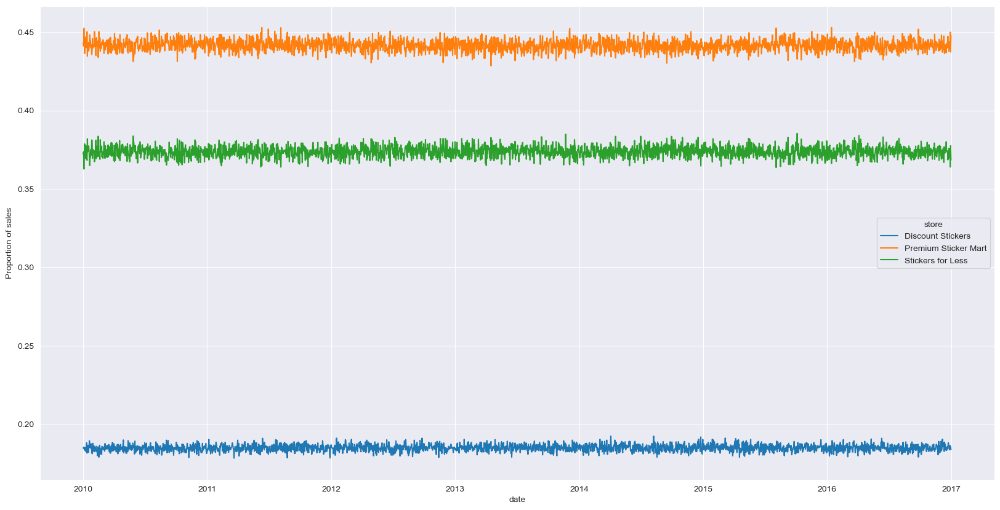

In [53]:
store_ratio_over_time = (train_df_imputed.groupby(["date","store"])["num_sold"].sum() / train_df_imputed.groupby(["date"])["num_sold"].sum()).reset_index()
f,ax = plt.subplots(figsize=(20,10))
sns.lineplot(data = store_ratio_over_time, x="date", y="num_sold", hue="store");
ax.set_ylabel("Proportion of sales");


In [54]:
def plot_adjusted_store(df):
    new_df = df.copy()
    weights = store_weights.loc["Premium Sticker Mart"] / store_weights
    print(weights)
    for store in weights.index:
        new_df.loc[new_df["store"] == store, "num_sold"] = new_df.loc[new_df["store"] == store, "num_sold"] * weights[store]
    plot_all(new_df)


If the lines between stores overlap perfectly then trend and seasonality are not unique to the store and we can ignore its effect.



store
Discount Stickers       2.390510
Premium Sticker Mart    1.000000
Stickers for Less       1.181537
Name: num_sold, dtype: float64


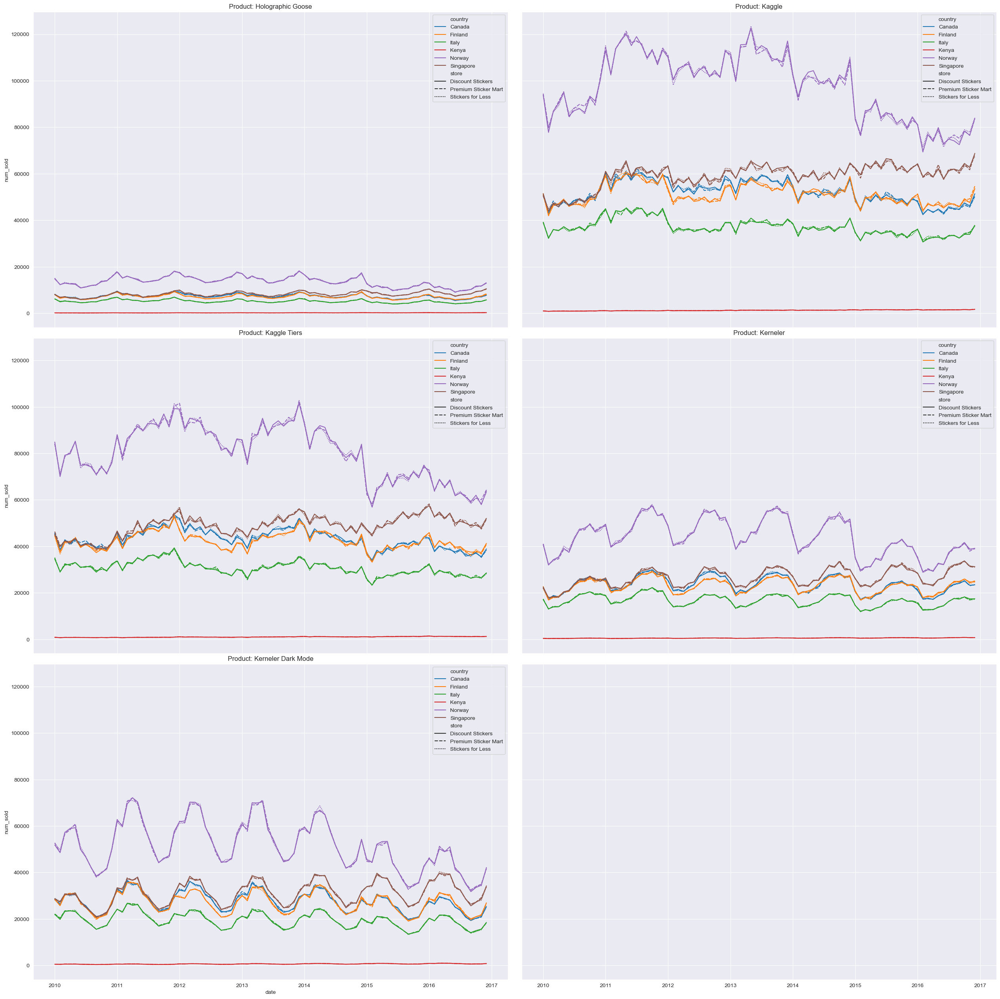

In [55]:
plot_adjusted_store(monthly_df)


Observations:

The dashed and solid lines representing the different stores overlap perfectly.

Insight:

This means we can perfectly predict the proportion of sales for each store, regardless of when it occurs.
Trend and seasonality are not unique to the store and we can ignore its effect. All differences in sales between stores can be explained by a single constant, which does not change over time.
This means we can forecast the store aggregated timeseries, and then disaggregating the forecasts based on historical proportions.


In [56]:
product_df = train_df_imputed.groupby(["date","product"])["num_sold"].sum().reset_index()

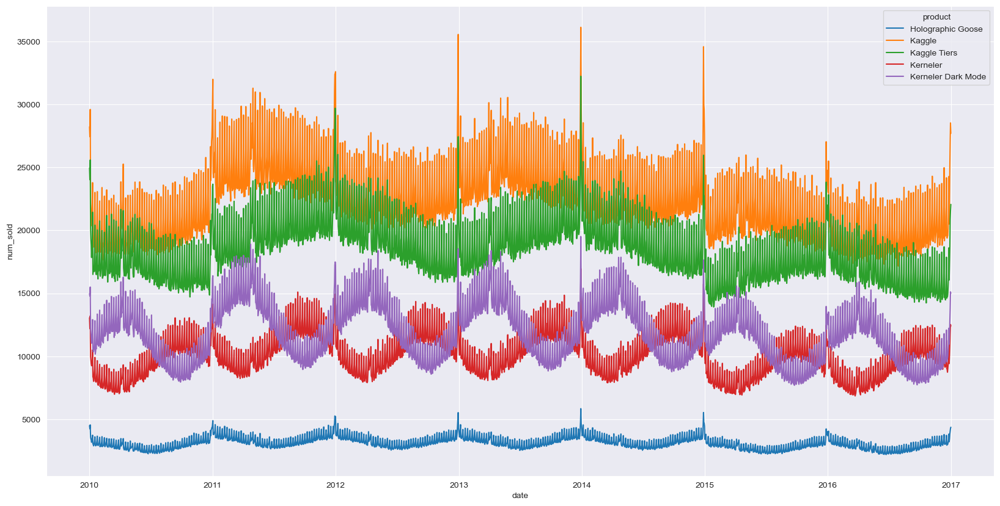

In [57]:
f,ax = plt.subplots(figsize=(20,10))
sns.lineplot(data=product_df, x="date", y="num_sold", hue="product");

Lets have a look at the proportion of sales for each product each day:



In [58]:
product_ratio_df = product_df.pivot(index="date", columns="product", values="num_sold")
product_ratio_df = product_ratio_df.apply(lambda x: x/x.sum(),axis=1)
product_ratio_df = product_ratio_df.stack().rename("ratios").reset_index()
product_ratio_df.head(4)


,date,product,ratios
0,2010-01-01,Holographic Goose,0.052441
1,2010-01-01,Kaggle,0.329305
2,2010-01-01,Kaggle Tiers,0.291165
3,2010-01-01,Kerneler,0.152373


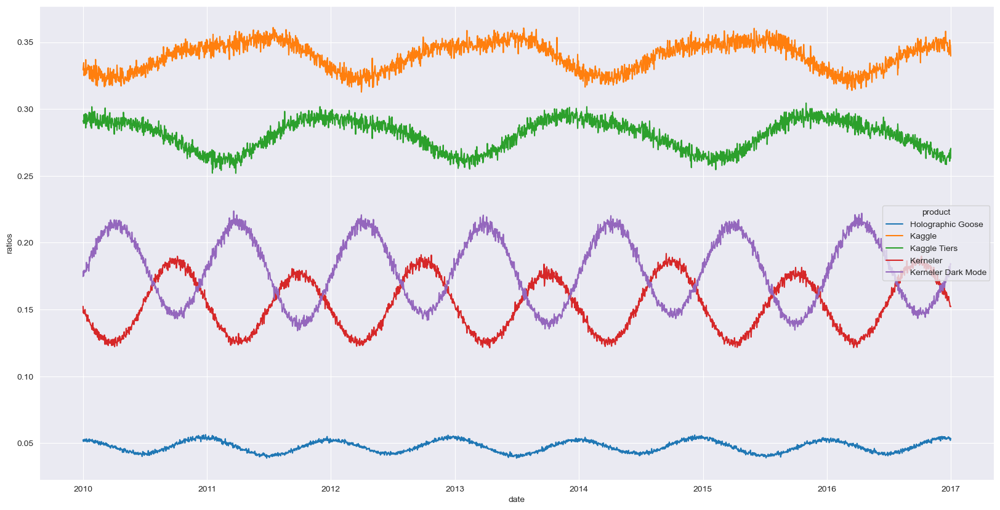

In [59]:
f,ax = plt.subplots(figsize=(20,10))
sns.lineplot(data = product_ratio_df, x="date", y="ratios", hue="product");


As we have a clear seasonal pattern of the ratio of sales for each product, we do not need to forecast each product individually (or treat product as a categorical variable etc.). Instead we can forecast the sum of all sales each day, then afterwards convert the forecasted sum down to the forecast for each product, using the forecasted ratios for each date

Conclusions

All this together means we only need to forecast 2 time series:

The total sales each day
The ratio in number of sales for each product each day
We still need to be careful about some timeseries where we might not have sales, or missing data.

Once we have completed the forecasts we can break the forecast down into the 3 categorical variables: Product, Country and Store.



# Aggregated Time Series


In [60]:
original_train_df_imputed = train_df_imputed.copy()
train_df_imputed = train_df_imputed.groupby(["date"])["num_sold"].sum().reset_index()

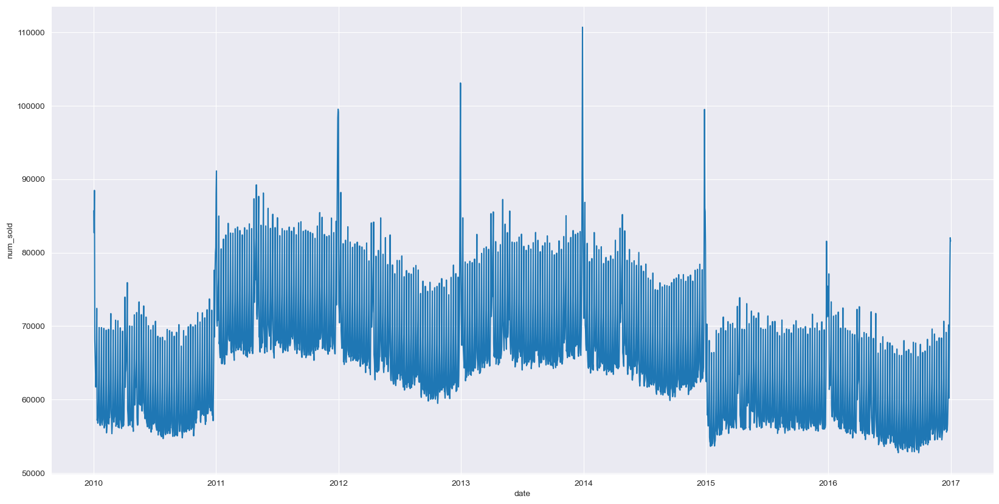

In [61]:
f,ax = plt.subplots(figsize=(20,10))
sns.lineplot(data = train_df_imputed, x="date", y="num_sold");

In [62]:
weekly_df = train_df.groupby([pd.Grouper(key="date", freq="W")])["num_sold"].sum().rename("num_sold").reset_index()
monthly_df = train_df.groupby([pd.Grouper(key="date", freq="MS")])["num_sold"].sum().rename("num_sold").reset_index()

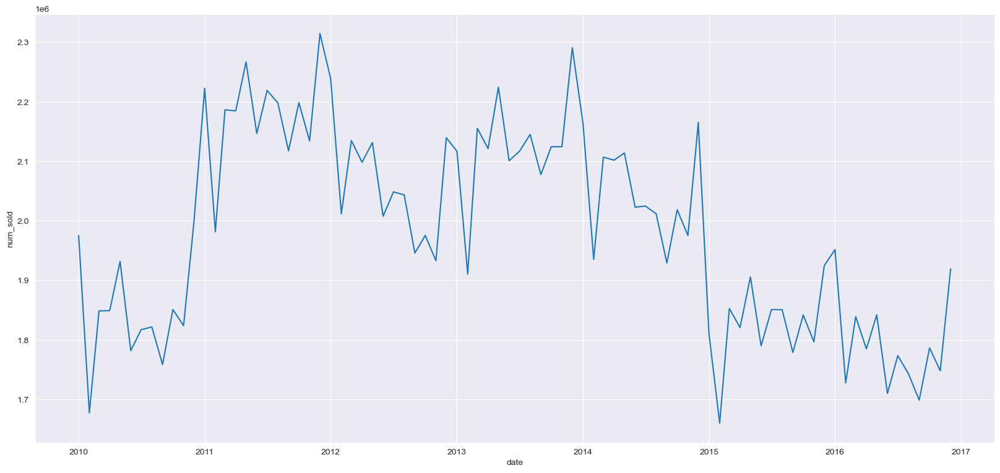

In [63]:
f,ax = plt.subplots(figsize=(20,9))
sns.lineplot(data=monthly_df, x="date", y="num_sold");

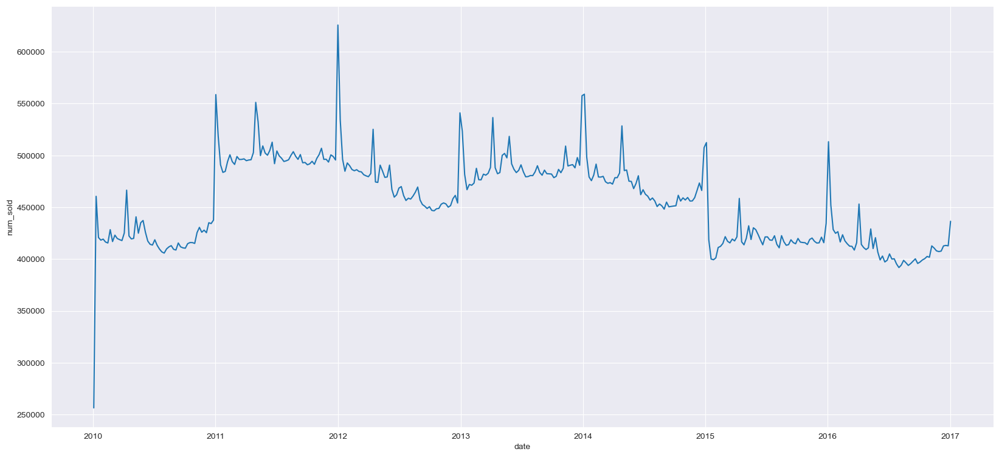

In [64]:
f,ax = plt.subplots(figsize=(20,9))
sns.lineplot(data=weekly_df, x="date", y="num_sold");

#Seasonality

## Analyzing Seasonal Patterns

In this section, we examine seasonal patterns in our aggregated time series data. The `plot_seasonality` function creates visualizations that highlight how sales vary by:

1. Month of year - to identify annual seasonal patterns
2. Day of week - to identify weekly patterns (e.g., weekday vs weekend differences)
3. Day of year - to identify specific days with recurring patterns

Understanding these seasonal patterns is crucial for our forecasting approach as they represent predictable recurring variations that our model needs to capture.

In [65]:
def plot_seasonality(df, x_axis):


    df["month"] = df["date"].dt.month
    df["day_of_week"] = df["date"].dt.dayofweek
    df["day_of_year"] = df['date'].apply(
        lambda x: x.timetuple().tm_yday if not (x.is_leap_year and x.month > 2) else x.timetuple().tm_yday - 1
    )

    f,ax = plt.subplots(1,1,figsize=(20,8))
    sns.lineplot(data=df, x=x_axis, y="num_sold", ax=ax);
    ax.set_title("{} Seasonality".format(x_axis))


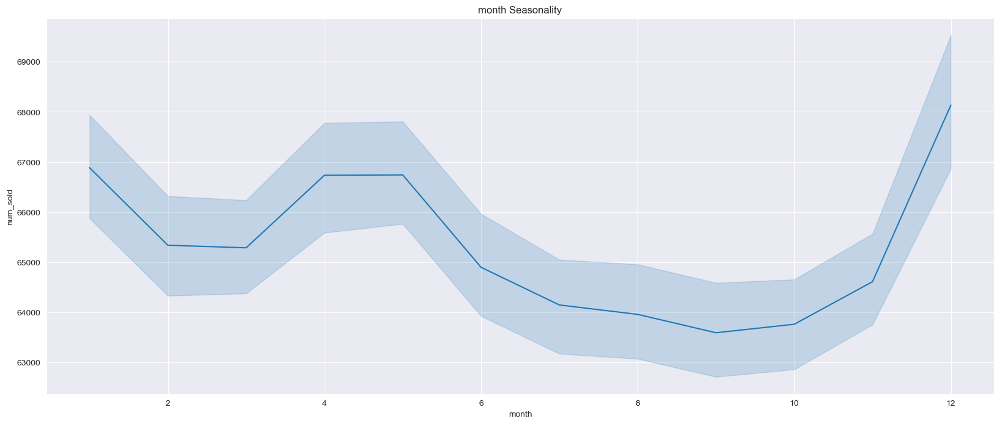

In [66]:
plot_seasonality(train_df_imputed, "month")


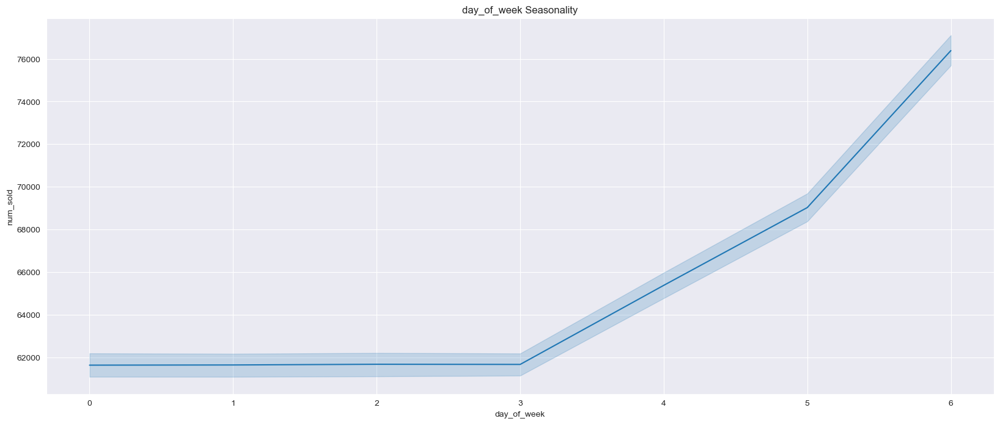

In [67]:
plot_seasonality(train_df_imputed, "day_of_week")

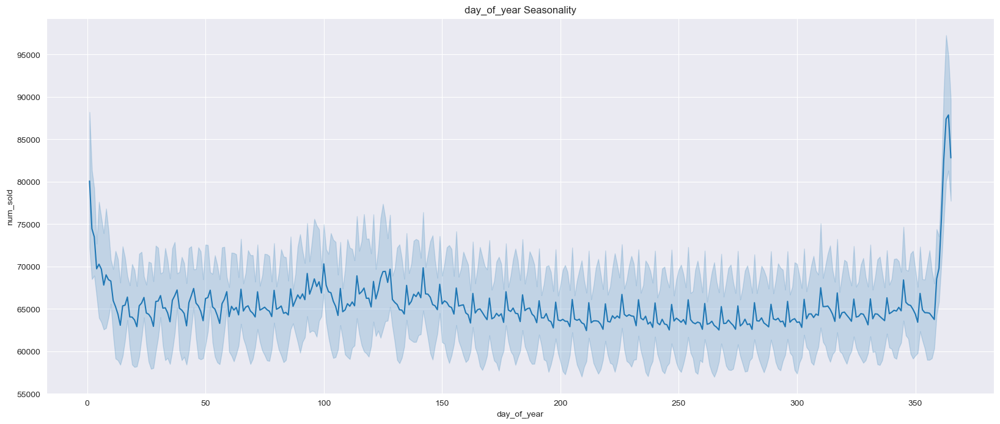

In [68]:
plot_seasonality(train_df_imputed, "day_of_year")

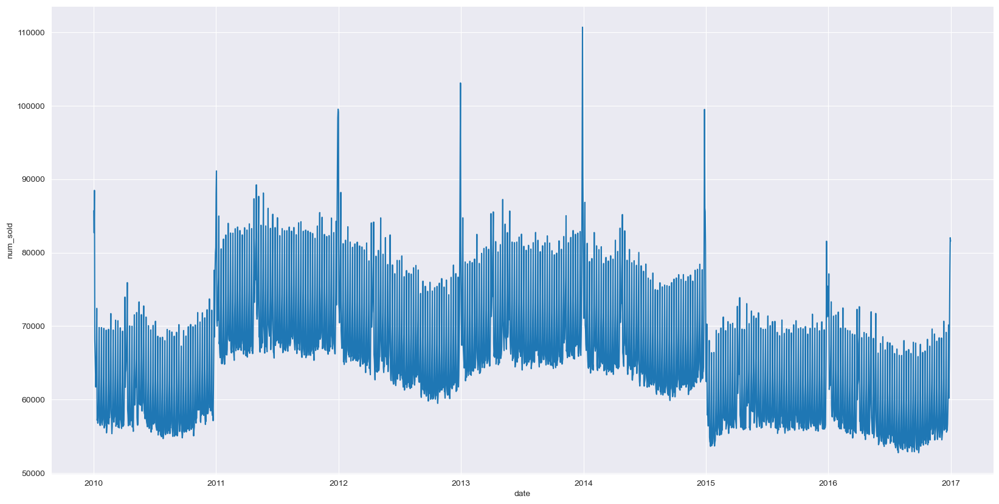

In [69]:
f,ax = plt.subplots(figsize=(20,10))
sns.lineplot(data = train_df_imputed, x="date", y="num_sold");

In [70]:
#get the dates to forecast for
test_total_sales_df = test_df.groupby(["date"])["id"].first().reset_index().drop(columns="id")
#keep dates for later
test_total_sales_dates = test_total_sales_df[["date"]]

In [ ]:
train_df_imputed

# Model Development

## Feature Engineering for Time Series

This function transforms our date features into model-friendly numeric features. We create:

1. Cyclical features using sine and cosine transformations for:
   - Month of year (captures annual seasonality)
   - Day of year (captures yearly patterns)
2. Categorical features for:
   - Day of week (grouped into weekday, Friday, Saturday, Sunday)
   - Important dates (holidays and special events)

These engineered features help our model capture seasonal patterns without requiring it to learn these relationships from scratch.

In [ ]:
def feature_engineer(df):
    new_df = df.copy()
    new_df["month"] = df["date"].dt.month
    new_df["month_sin"] = np.sin(new_df['month'] * (2 * np.pi / 12))
    new_df["month_cos"] = np.cos(new_df['month'] * (2 * np.pi / 12))
    new_df["day_of_week"] = df["date"].dt.dayofweek
    new_df["day_of_week"] = new_df["day_of_week"].apply(lambda x: 0 if x<=3 else(1 if x==4 else (2 if x==5 else (3))))

    new_df["day_of_year"] = df['date'].apply(
        lambda x: x.timetuple().tm_yday if not (x.is_leap_year and x.month > 2) else x.timetuple().tm_yday - 1
    )
    new_df['day_sin'] = np.sin(new_df['day_of_year'] * (2 * np.pi /  365.0))
    new_df['day_cos'] = np.cos(new_df['day_of_year'] * (2 * np.pi /  365.0))

    #new_df['week_of_year'] = new_df['date'].dt.isocalendar().week

    new_df["important_dates"] = new_df["day_of_year"].apply(lambda x: x if x in [1,2,3,4,5,6,7,8,9,10,99, 100, 101, 125,126,355,256,357,358,359,360,361,362,363,364,365] else 0)
    #new_df["year"] = df["date"].dt.year - 2010

    new_df = new_df.drop(columns=["date","month","day_of_year"])
    new_df = pd.get_dummies(new_df, columns = ["important_dates","day_of_week"], drop_first=True)

    return new_df

In [ ]:
train_total_sales_df = feature_engineer(train_df_imputed)
test_total_sales_df = feature_engineer(test_total_sales_df)

In [ ]:
display(train_total_sales_df.head(2))
display(test_total_sales_df.head(2))

In [ ]:
y = train_total_sales_df["num_sold"]
X = train_total_sales_df.drop(columns="num_sold")
X_test = test_total_sales_df

In [ ]:
!pip install xgboost scikit-learn autogluon

In [ ]:
from autogluon.tabular import TabularDataset, TabularPredictor

predictor = TabularPredictor(label='num_sold',eval_metric="mean_absolute_percentage_error").fit(train_data=train_total_sales_df,presets='best')
predictions = predictor.predict(X_test)

In [ ]:
test_total_sales_dates["num_sold"] = predictions

In [ ]:
f,ax = plt.subplots(figsize=(20,10))
sns.lineplot(data = pd.concat([train_df_imputed,test_total_sales_dates]).reset_index(drop=True), x="date", y="num_sold", linewidth=0.6);

In [ ]:
product_ratio_2017_df = product_ratio_df.loc[product_ratio_df["date"].dt.year == 2015].copy()
product_ratio_2018_df = product_ratio_df.loc[product_ratio_df["date"].dt.year == 2016].copy()
product_ratio_2019_df = product_ratio_df.loc[product_ratio_df["date"].dt.year == 2015].copy()

product_ratio_2017_df["date"] = product_ratio_2017_df["date"] + pd.DateOffset(years=2)
product_ratio_2018_df["date"] = product_ratio_2018_df["date"] + pd.DateOffset(years=2)
product_ratio_2019_df["date"] =  product_ratio_2019_df["date"] + pd.DateOffset(years=4)

forecasted_ratios_df = pd.concat([product_ratio_2017_df, product_ratio_2018_df, product_ratio_2019_df])

In [ ]:
temp_df = pd.concat([product_ratio_df,forecasted_ratios_df]).reset_index(drop=True)
f,ax = plt.subplots(figsize=(20,10))
sns.lineplot(data=temp_df, x="date", y="ratios", hue="product");
ax.axvline(pd.to_datetime("2017-01-01"), color='black', linestyle='--');

In [ ]:
# Adding in the store ratios
store_weights_df = store_weights.reset_index()
test_sub_df = pd.merge(test_df, test_total_sales_dates, how="left", on="date")
test_sub_df = test_sub_df.rename(columns = {"num_sold":"day_num_sold"})
# Adding in the product ratios
test_sub_df = pd.merge(test_sub_df, store_weights_df, how="left", on="store")
test_sub_df = test_sub_df.rename(columns = {"num_sold":"store_ratio"})
# Adding in the country ratios
test_sub_df["year"] = test_sub_df["date"].dt.year
test_sub_df = pd.merge(test_sub_df, gdp_per_capita_filtered_ratios_df_2, how="left", on=["year", "country"])
test_sub_df = test_sub_df.rename(columns = {"ratio":"country_ratio"})
# Adding in the product ratio
test_sub_df = pd.merge(test_sub_df, forecasted_ratios_df, how="left", on=["date", "product"])
test_sub_df = test_sub_df.rename(columns = {"ratios":"product_ratio"})

# Disaggregating the forecast
test_sub_df["num_sold"] = test_sub_df["day_num_sold"] * test_sub_df["store_ratio"] * test_sub_df["country_ratio"] * test_sub_df["product_ratio"]
test_sub_df["num_sold"] = test_sub_df["num_sold"].round()
display(test_sub_df.head(2))


In [ ]:
def plot_individual_ts(df):
    colour_map = {"Canada": "blue", "Finland": "orange", "Italy": "green", "Kenya":"red", "Norway": "purple", "Singapore": "brown"}
    for country in df["country"].unique():
        f,axes = plt.subplots(df["store"].nunique()*df["product"].nunique(),figsize=(20,75))
        count = 0
        for store in df["store"].unique():
            for product in df["product"].unique():
                plot_df = df.loc[(df["product"] == product) & (df["country"] == country) & (df["store"] == store)]
                sns.lineplot(data = plot_df, x= "date", y="num_sold", linewidth=0.5, ax=axes[count], color=colour_map[country])
                axes[count].set_title(f"{country} - {store} - {product}")
                axes[count].axvline(pd.to_datetime("2017-01-01"), color='black', linestyle='--');
                count+=1


In [ ]:
plot_individual_ts(pd.concat([original_train_df_imputed,test_sub_df]).reset_index(drop=True))


In [ ]:
submission = pd.read_csv("sample_submission.csv")
submission["num_sold"] = test_sub_df["num_sold"]
display(submission.head(2))

In [ ]:
submission.to_csv('/content/drive/MyDrive/Kaggle_Comp/submission_4.csv', index = False)